# ΤΕΧΝΟΛΟΓΙΑ ΕΙΚΟΝΑΣ ΚΑΙ ΒΙΝΤΕΟ (8ο ΕΞΑΜΗΝΟ)

# 1η Εργαστηριακή Άσκηση

**Φοιτητές**: Γιαννιός Γεώργιος Ταξιάρχης 031 16 156<br>$\;\;\;\;\;\;\;\;\;\;\;\;\;$Τσαμπάζη Μαρία 031 15 716 <br> **Ομάδα**: $\;\;\;\;$F10

# Ερώτημα 1 (50%)
Στο ερώτημα αυτό θα χρησιμοποιήσετε αλγορίθμους εύρεσης ακμών, για να παράξετε ένα **cartoonified** αποτέλεσμα της εικόνας εισόδου. Το σκεπτικό είναι να εκμεταλευθείτε τις φυσικές ακμές της εικόνας για να δημιουργήσετε "περιγράμματα".

Για την επιτυχή Εκτέλεση **Όλων** των Βημάτων θα πρέπει 
1.   Να κάνετε **download** τις εικόνες "mary.jpg" και "george.png"
2.   Όταν σας ζητηθεί, να τις κάνετε **browse** με τη σειρά αυτή.

Στο αρχείο **steps.jpg** μπορείτε επίσης να δείτε ένα Πανόραμα των Βημάτων 

In [1]:
# Εισαγωγή απαραίτητων imports εδώ
from google.colab import files
from IPython.display import Image
from google.colab.patches import cv2_imshow

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage, misc
%matplotlib inline

import matplotlib.pylab as pylab
from scipy import ndimage as ndi
from skimage.util import random_noise


from skimage import filters
from skimage.morphology import disk

from skimage import feature
from skimage.filters import laplace

from scipy import signal

In [2]:
#Συνάρτηση για Απεικόνιση πολλών Εικόνων(Πηγή: Lab 5_Edges_Detection)

from skimage import img_as_float

def imshow_all(*images, titles=None):
    images = [img_as_float(img) for img in images]

    if titles is None:
        titles = [''] * len(images)
    vmin = min(map(np.min, images))
    vmax = max(map(np.max, images))
    ncols = len(images)
    height = 5
    width = height * len(images)
    fig, axes = plt.subplots(nrows=1, ncols=ncols,
                             figsize=(width, height))
    for ax, img, label in zip(axes.ravel(), images, titles):
        ax.imshow(img,  cmap='gray', interpolation='None')#vmin=vmin, vmax=vmax,
        ax.set_title(label)

Η υλοποίηση του ερωτήματος θα ακολουθεί τα εξής βήματα:

1.   Να δημιουργήσετε **μια εικόνα με τα πρόσωπα των μελών της ομάδας σας**. Μπορείτε να αποκτήσετε την εικόνα κάθε μέλους με όποιον τρόπο θέλετε, αρκεί να είναι όσο πιο καθαρή γίνεται, σε όσο το δυνατόν καλύτερες συνθήκες φωτισμού. Οι διαστάσεις των ατομικών εικόνων προτείνουμε να είναι **512x288**.
  
- **Για ομάδες 2 ατόμων:** Να φορτώσετε και να ενώσετε, με τη χρήση κώδικα python, τις εικόνες των επι μέρους μελών σε μια τελική εικόνα  (**512x576**.)

# **ΕΡΩΤΗΣΗ 1: ΑΝΕΒΑΣΜΑ ΦΩΤΟΓΡΑΦΙΩΝ**

In [4]:
#Ανέβασμα πρώτης φωτογραφίας (mary) διαστάσεων (512 x 288)
uploaded = files.upload()
img1 = cv2.imread('mary.jpg')

#Mετατροπή από BGR σε RGB για απεικόνιση ως Έγχρωμη Εικόνα
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

#Ανέβασμα δεύτερης φωτογραφίας (george) διαστάσεων (512 x 288)
uploaded = files.upload()
img2 = cv2.imread('george.jpg')
#Mετατροπή από BGR σε RGB για απεικόνιση ως Έγχρωμη Εικόνα
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

# Ένωση Εικόνων σε μια τελική διαστάσεων (512x576)
combined_image = np.concatenate((img1, img2), axis=0)

Saving mary.jpg to mary (1).jpg


Saving george.jpg to george (1).jpg


Text(0.5, 1.0, 'Aνάγνωση- Απεικόνιση Έγχρομων εικόνων')

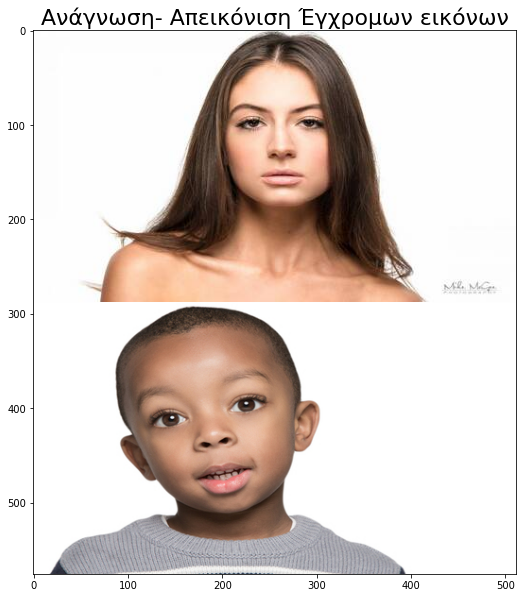

In [5]:
#Aπεικόνιση Εικόνων (Έγχρωμες)
plt.figure(figsize=(20,10))
plt.imshow(combined_image,cmap='gray')
plt.title("Aνάγνωση- Απεικόνιση Έγχρομων εικόνων",size=22)


# ΕΡΩΤΗΣΗ 2: ΕΠΙΛΟΓΗ ΧΡΩΜΑΤΙΚΟΥ ΧΩΡΟΥ

2. Να επιλέξετε τον κατάλληλο χρωματικό χώρο για την εικόνα εισόδου σας.

Αρχικά λοιπόν, μετατρέψαμε την Εικόνα σε **grayscale** :



Text(0.5, 1.0, 'Aνάγνωση- Απεικόνιση Aσπρόμαυρων εικόνων')

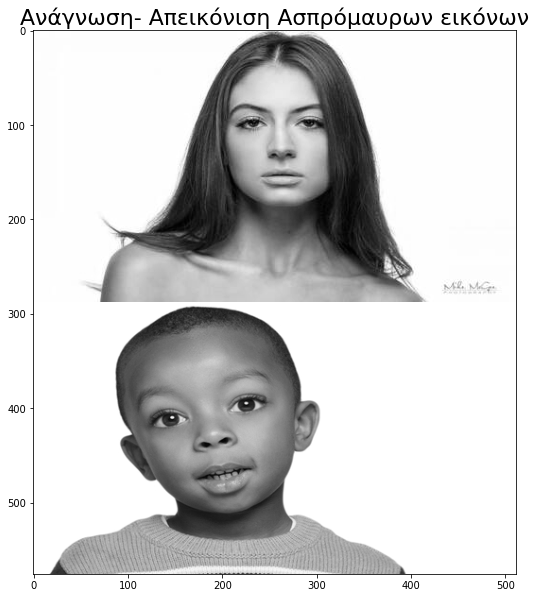

In [6]:
#Μετατροπή σε Gray-Scale
gray_image = cv2.cvtColor(combined_image, cv2.COLOR_BGR2GRAY)

#Aπεικόνιση
plt.figure(figsize=(20,10))
plt.imshow(gray_image,cmap='gray')
plt.title("Aνάγνωση- Απεικόνιση Aσπρόμαυρων εικόνων",size=22)


# **ΕΡΩΤΗΣΗ 3: ΠΡΟΣΘΗΚΗ ΘΟΡΥΒΟΥ**


3.   Να εφαρμόσετε θόρυβο στην εικόνα, χρησιμοποιώντας τη μέθοδο `random_noise` του πακέτου `skimage.util` και να ακολουθήστε τα παρακάτω, μοναδικά για την κάθε ομάδα, βήματα. Στη συνέχεια να τυπώσετε το αποτέλεσμα.

*   **Gaussian** θόρυβο, με `seed` ίσο με το **τελευταίο** ψηφίο του **ΑΜ** του πρώτου (ή μοναδικού) μέλους της ομάδας.
*   **Salt and Pepper** θόρυβο με `seed` ίσο με το **τελευταίο** ψηφίο του **ΑΜ** του πρώτου (ή μοναδικού) μέλους της ομάδας και `amount` που δίνεται από τον τύπο:

  $amount(x)=\frac{1}{90}x + 0.3$

  όπου $x$ το **προτελευταίο** ψηφίο του **ΑΜ** του ίδιου μέλους. Ο παραπάνω τύπος θα πρέπει να υλοποιηθεί σε ξεχωριστή **μέθοδο** στον κώδικά σας και να καλείται όταν χρειαστεί.

In [7]:
#Συνάρτηση που επιστρέφει το amount του Salt and Pepper για τιμή x
def snpAmount(x):
  return (x/90 +0.3)

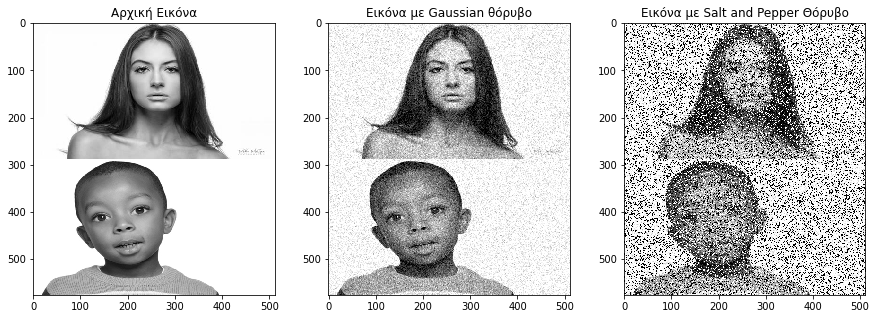

In [8]:
#Εφαρμογή Θορύβου στην εικόνα και παραμετροποίηση βάσει ΑΜ:

#Τελικά Ψηφία Α.Μ:

#Μέλος 1 : 6
#Mέλος 2 : 6

#Gaussian:
gaussian_noisy = random_noise(gray_image, mode='gaussian',seed=6)

#Salt and Paper 
a =  snpAmount(6)
sp_noisy = random_noise(gaussian_noisy, mode='s&p',amount = a)

imshow_all(gray_image,gaussian_noisy,sp_noisy,titles = ['Αρχική Εικόνα','Εικόνα με Gaussian θόρυβο','Εικόνα με Salt and Pepper Θόρυβο'])

# **EΡΩΤΗΣΗ 4: ΦΙΛΤΡΑΡΙΣΜΑ ΕΙΚΟΝΩΝ**

4.   Να εφαρμόσετε **mean**, **median** και **gaussian filtering** και στις δύο εικόνες του προηγούμενου βήματος. Μπορείτε να πειραματιστείτε με την παραμετροποίηση των φίλτρων. Να τυπώσετε το αποτέλεσμα της εφαρμογής κάθε φιλτρου (συμπεριλαμβανομένων των διάφορων πειραματισμών που θα κάνετε). Συγκρίνετε τα αποτελέσματα και εξηγήστε ποιό φίλτρο απέδωσε καλύτερα σε κάθε εικόνα και γιατί.

# 1 Φιλτράρισμα Gaussian 

## 1.1 Εικόνα με Gaussian Noise 

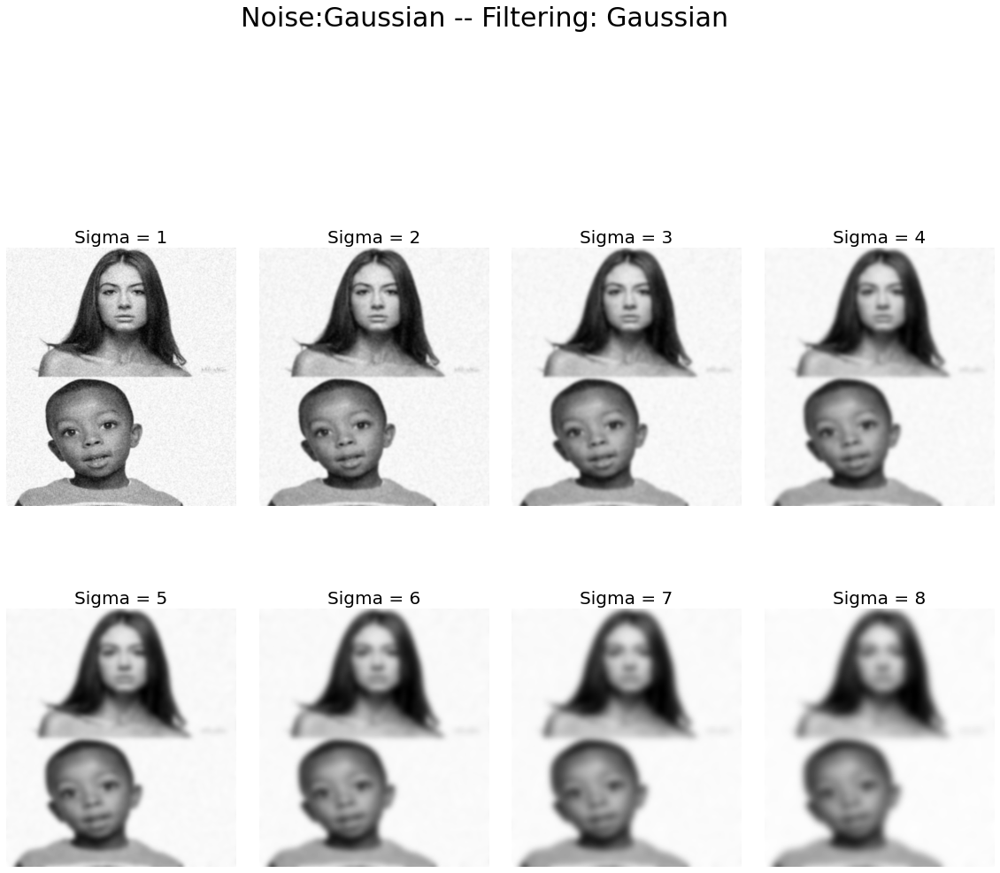

In [9]:
#Gaussian Filtering στην Εικόνα με Gaussian Noise :

pylab.figure(figsize=(20,30))
pylab.suptitle("Noise:Gaussian -- Filtering: Gaussian", size=30)

#Πειραματισμός για διάφορα sigma =[1,2,...,8]
for sigma in list(range(1,9)):
    filtered=filters.gaussian(gaussian_noisy, sigma=sigma)  
    pylab.subplot(4,4,sigma), pylab.imshow(filtered, cmap='gray'), pylab.axis('off')
    pylab.title('Sigma = ' + str(sigma), size=20)

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Παρατηρούμε ότι μια *καλή* αποθορυβοποίηση πραγματοποιείται για **sigma=3**. Για μεγαλύτρες τιμές η εικόνα θολώνει (*blur*) ενώ για μικρότερες τιμές δεν εξομαλύνεται ο θόρυβος.

## 1.2 Εικόνα με Salt & Pepper Noise 

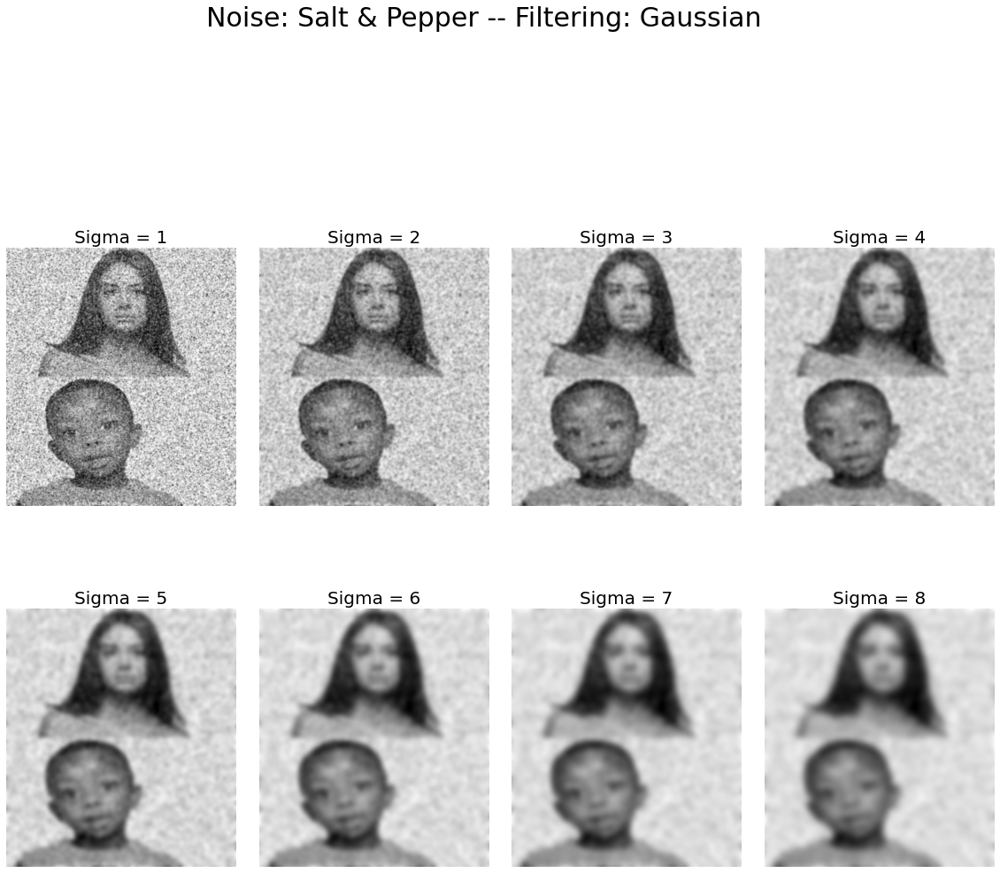

In [10]:
#Gaussian Filtering στην Εικόνα με Salt & Pepper Noise:

pylab.figure(figsize=(20,30))
pylab.suptitle("Noise: Salt & Pepper -- Filtering: Gaussian", size=30)

#Πειραματισμός για διάφορα sigma =[1,2,...,8]
for sigma in list(range(1,9)):
    filtered=filters.gaussian(sp_noisy, sigma=sigma)  
    pylab.subplot(4,4,sigma), pylab.imshow(filtered, cmap='gray'), pylab.axis('off')
    pylab.title('Sigma = ' + str(sigma), size=20)

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Παρατηρούμε ότι ο θόρυβος αυτός αλλοιώνει αρκετά το οπτικό περιεχόμενο. Εντούτοις για **sigma = 7** , πετυχαίνουμε μια καλή εξομάλυνση, η οποία όμως θολώνει αναπόφευκτα την εικόνα μας. 

# 2 Φιλτράρισμα Mean 

In [11]:
# Δημιουργία Kernel μεγέθους (n x n) με τιμές (1/n^2)
def kernel(n):
  return np.full((n, n), 1/(n**2))

## 2.1 Εικόνα με Gaussian Noise 

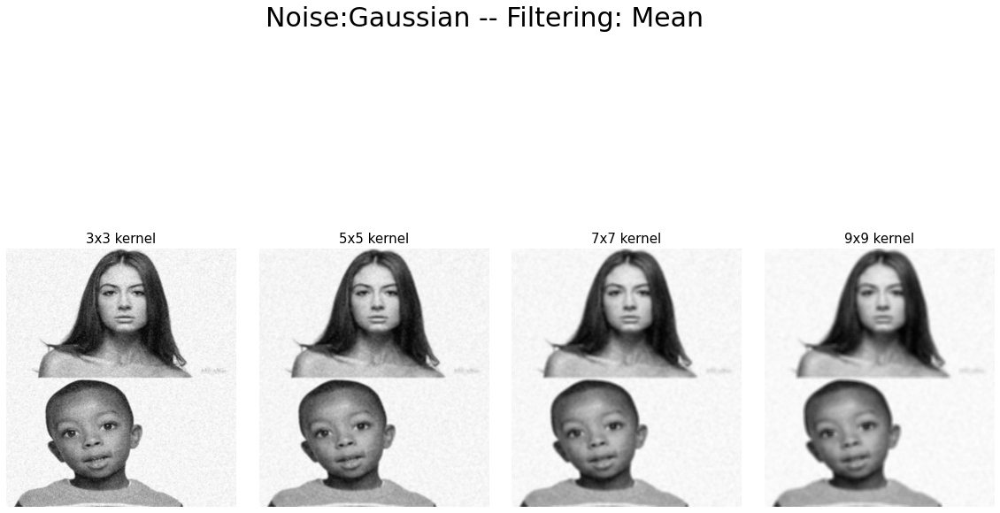

In [12]:
#Mean Filtering στην Εικόνα με Gaussian Noise:
pylab.figure(figsize=(20,30))
pylab.suptitle("Noise:Gaussian -- Filtering: Mean", size=30)

#Πειραμαστισμός για διάφορα μεγέθη πυρήνων: (3x3),(5x5),(7x7),(9x9):
kernel_shapes =range(3,11,2)

i=1
for n in list(kernel_shapes):
    filtered= ndi.correlate(gaussian_noisy,kernel(n))
    pylab.subplot(4,4,i), pylab.imshow(filtered, cmap='gray'), pylab.axis('off')
    pylab.title(str(n)+'x'+str(n)+' kernel', size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show() 

Γίνεται αντιληπτό ότι με *Mean Filtering* καταφέρνουμε παρόμοια αποτελέσματα με *Gaussian Filtering* . Σχετικά με *Mean Filtering* μια καλή αποθορυβοποίηση παρατηρείται για μέγεθος πυρήνα (7 x 7). Απο κει και πέρα θολώνει αρκετά η εικόνα μας.

## 2.2 Εικόνα με Salt & Pepper Noise 

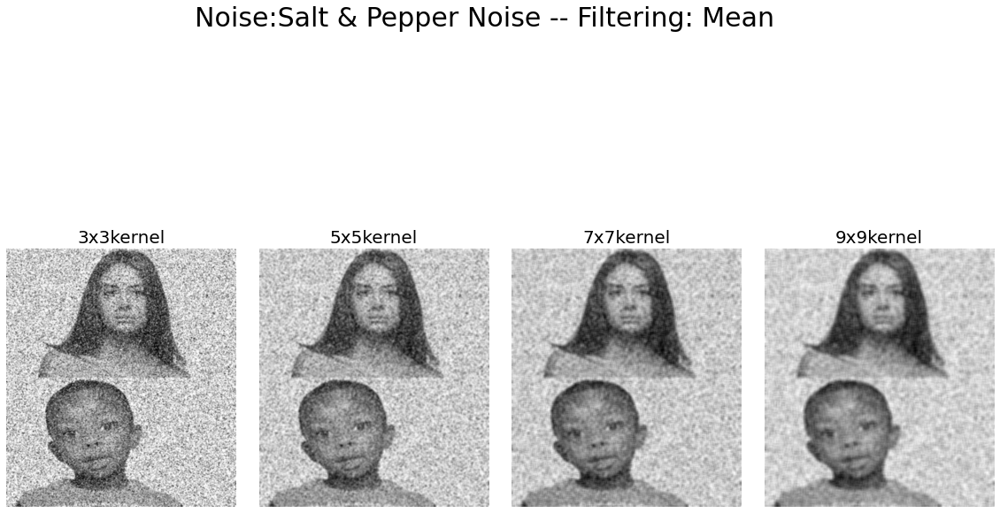

In [13]:
#Mean Filtering στην Εικόνα με Salt & Pepper Noise:
pylab.figure(figsize=(20,30))
pylab.suptitle("Noise:Salt & Pepper Noise -- Filtering: Mean", size=30)

kernel_shapes =range(3,11,2)
i=1

for n in list(kernel_shapes):
    img_log= ndi.correlate(sp_noisy,kernel(n))
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title(str(n)+'x'+str(n)+'kernel', size=20)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

#Καλύτερο αποτέλεσμα για 5*5  

# 3 Φιλτράρισμα Median 

## Εικόνα με Gaussian Noise 

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


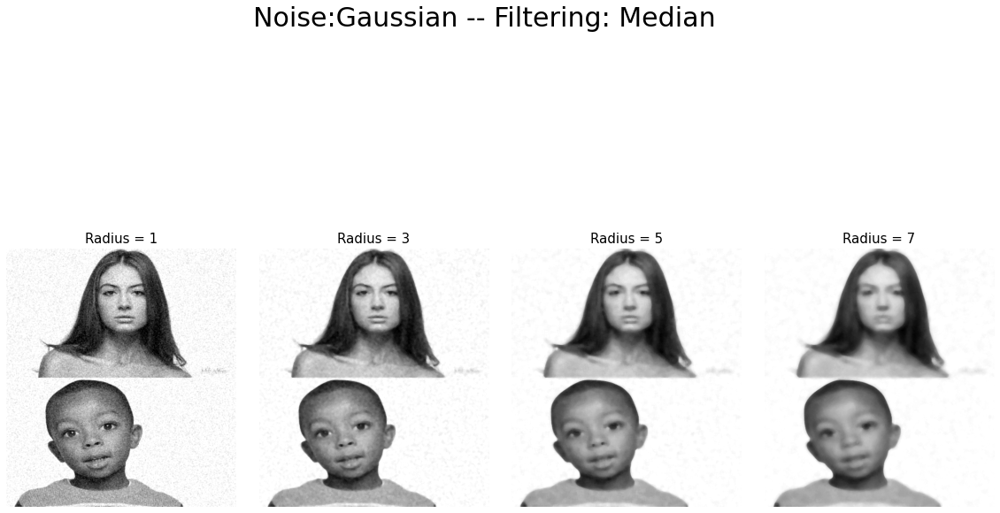

In [14]:
#Mean Filtering στην Εικόνα με Gaussian Noise:
pylab.figure(figsize=(20,30))
pylab.suptitle("Noise:Gaussian -- Filtering: Median", size=30)

i=1
for r in list(range(1,8,2)):
    img_log= filters.rank.median(gaussian_noisy,disk(r))
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Radius = '+str(r), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

#Καλύτερο αποτέλεσμα για R = 3


## Εικόνα με Salt & Pepper Noise 

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


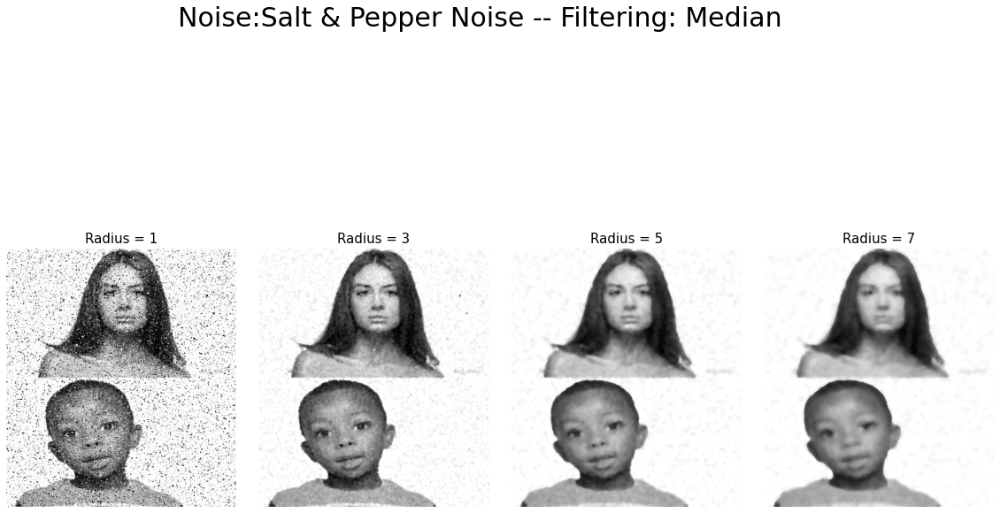

In [15]:
#Median Filtering στην Εικόνα με Salt & Pepper Noise:
pylab.figure(figsize=(20,30))
pylab.suptitle("Noise:Salt & Pepper Noise -- Filtering: Median ", size=30)

i=1
for r in list(range(1,8,2)):
    img_log= filters.rank.median(sp_noisy,disk(r))
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Radius = '+str(r), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()


#Καλύτερο αποτέλεσμα για R = 3

# **ΕΡΩΤΗΣΗ 5 :ΑΝΙΧΝΕΥΣΗ AKMΩΝ** 

5.   Να εφαρμόσετε τους ανιχνευτές ακμών **Laplacian**, **Canny** και **Marr-Hildreth** στα καλύτερα αποτελέσματα αποθορυβοποίησης των δύο εικόνων θορύβου του βήματος 3 (το καλύτερο αποτέλεσμα για την εικόνα gaussian θορύβου και το καλύτερο αποτέλεσμα για την εικόνα salt and pepper θορύβου). Μπορείτε να πειραματιστείτε με την παραμετροποίηση των ανιχνευτών, με στόχο το καλύτερο δυνατό αποτέλεσμα. Να τυπώσετε το αποτέλεσμα της εφαρμογής κάθε φιλτρου (συμπεριλαμβανομένων των διάφορων πειραματισμών που θα κάνετε).

# 1 Laplacian

# 1.1 Εικόνα με θόρυβο Gaussian

## 1.1.1 Εξομάλυνση με Gaussian filter

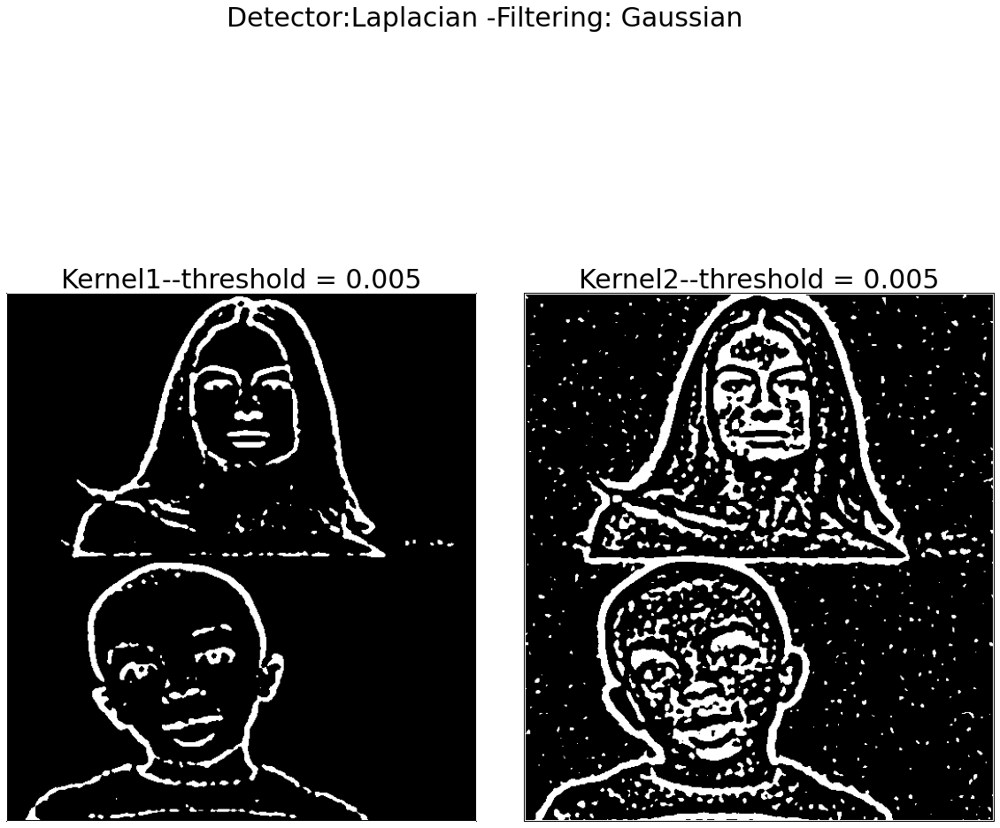

In [16]:
#Καλύτερο αποτέλεσμα με Gaussian Filtering για sigma = 1 
filtered=filters.gaussian(gaussian_noisy, sigma=3) 

#Δημιουργία δύο διαφορετικών πυρήνων 


#Ισοτροπική Μάσκα για μεταβολές 90 μοιρών
laplacian_kernel = [[0,1,0],[1, -4, 1],[0,1,0]]

#Ισοτροπική Μάσκα για μεταβολές 45 μοιρών
laplacian_kernel1 = [[-1,-1,-1],[-1, 8, -1],[-1,-1,-1]]
kernels =[laplacian_kernel,laplacian_kernel1]

#Κατωφλιοποίηση βάσει threshold
threshold = 0.005


pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Laplacian -Filtering: Gaussian", size=30)

i=1
for k in list(kernels):
  # Συνέλιξη με Laplacian Kerenl και Κανονικοποίηση στο [0,1]
  CBconvimlaplacian = np.clip(signal.convolve2d(filtered,k),0,1)
  #Κατωφλιοποίηση (>threshold):
  CBconvimlaplacian = CBconvimlaplacian > threshold


  #Aποθήκευση Καλύτερου Αποτελέσματος:
  if (i ==1):
    Result1 = CBconvimlaplacian


  pylab.subplot(2,2,i), pylab.imshow(CBconvimlaplacian, cmap='gray'), pylab.axis('off')
  pylab.title('Kernel'+str(i)+'--threshold = '+str(threshold), size=30)
  i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()


Παρατηρούμε ότι χρησιμοποιώντας την *Ισοτροπική Μάσκα* για μεταβολές 90 μοιρών(**Kernel1**) πετυχαίνουμε καλύτερα αποτελέσματα απο ότι με τη Δεύτερη Μάσκα(Kernel2). Να σημειωθεί ότι για να λάβουμε καλύτερο αποτέλεσμα με τη Δεύτερη Μάσκα, κρίνεται απαραίτητο να **αυξήσουμε** το **threshold** 


Οπότε κρατάμε το **πρώτο** αποτέλεσμα σε μια μεταβλητή (Result1) (Για να το χρησιμοποιήσουμε στην παραγωγή cartoonify αποτελέσματος):

## 1.1.2 Εξομάλυνση με Mean filter

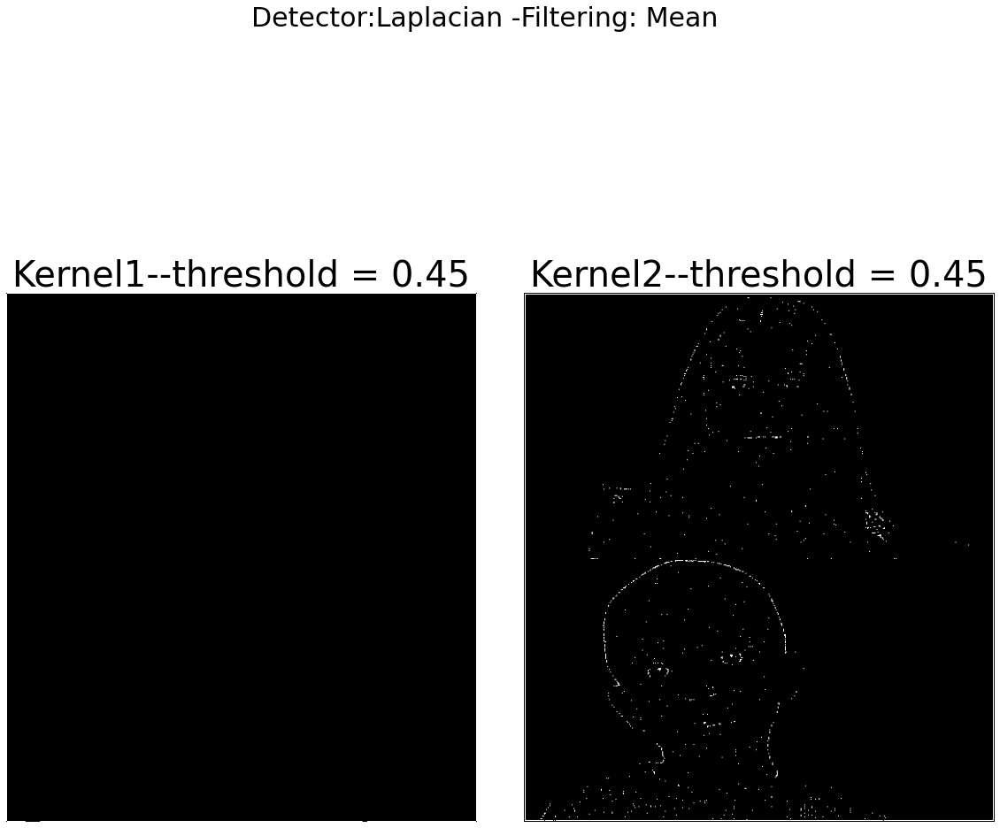

In [17]:
#Καλύτερο αποτέλεσμα με Mean Filtering για kernel (3x3) 
img_log1=ndi.correlate(gaussian_noisy,kernel(3))

#Ισοτροπική Μάσκα για μεταβολές 90 μοιρών
laplacian_kernel = [[0,1,0],[1, -4, 1],[0,1,0]]
#Ισοτροπική Μάσκα για μεταβολές 45 μοιρών
laplacian_kernel1 = [[-1,-1,-1],[-1, 8, -1],[-1,-1,-1]]

kernels =[laplacian_kernel,laplacian_kernel1]

pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Laplacian -Filtering: Mean", size=30)

#Κατωφλιοποίηση (>threshold):
threshold = 0.45

i=1
for k in list(kernels):
  # Συνέλιξη με Laplacian Kerenl και Κανονικοποίηση στο [0,1]
  CBconvimlaplacian = np.clip(signal.convolve2d(img_log1,k),0,1)
  #Κατωφλιοποίηση (>threshold):
  CBconvimlaplacian = CBconvimlaplacian > threshold
  pylab.subplot(2,2,i), pylab.imshow(CBconvimlaplacian, cmap='gray'), pylab.axis('off')
  pylab.title('Kernel'+str(i)+'--threshold = '+str(threshold), size=40)
  i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Παρατηρούμε ότι χρησιμοποιώντας την *Ισοτροπική Μάσκα* για μεταβολές 45 μοιρών(**Kernel1**) πετυχαίνουμε καλύτερα αποτελέσματα απο ότι με τη Πρώτη Μάσκα(Kernel1). Να σημειωθεί ότι για να λάβουμε καλύτερο αποτέλεσμα με τη Πρώτη  Μάσκα, κρίνεται απαραίτητο να **μειώσουμε** το **threshold**

Ωστόσο επειδή το αποτέλεσμα δεν ήταν αρκετά αντιπροωσπευτικό, **δεν** αποθηκεύουμε την δυαδική εικόνα για παραγωγή Cartoonified 

## 1.1.3 Εξομάλυνση με Median filter

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


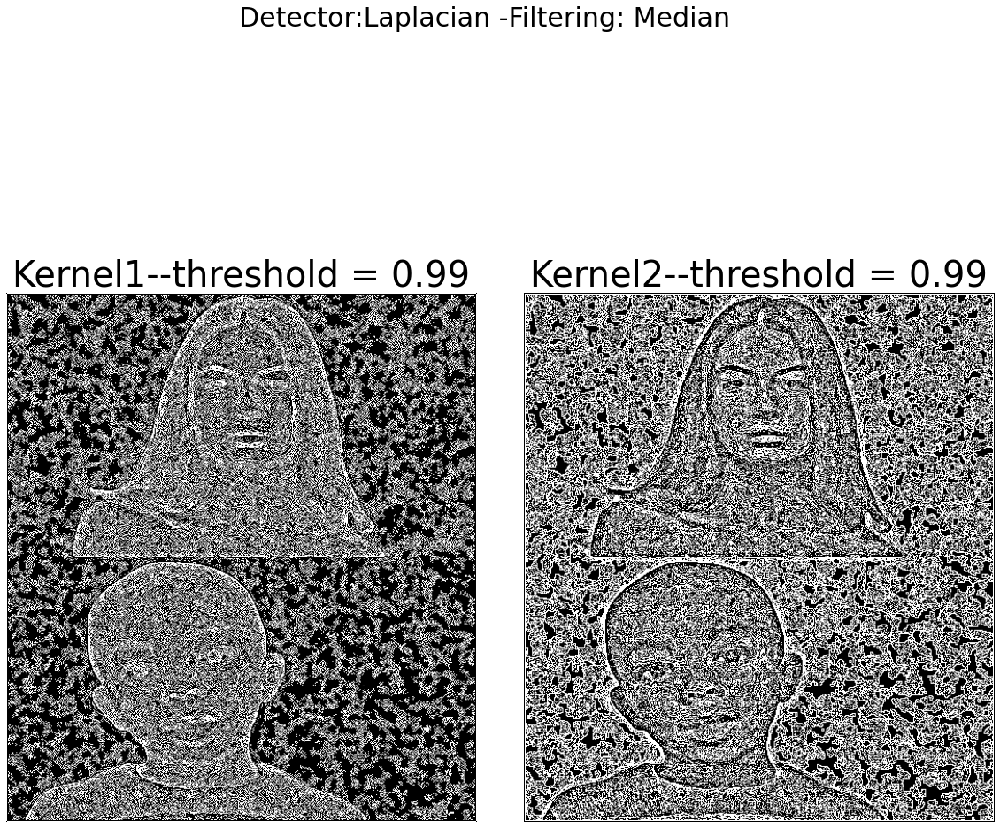

In [18]:
#Καλύτερο αποτέλεσμα με Median Filtering για radius  = 4 
filtered=filters.rank.median(gaussian_noisy,disk(4))

#Ισοτροπική Μάσκα για μεταβολές 90 μοιρών
laplacian_kernel = [[0,1,0],[1, -4, 1],[0,1,0]]
#Ισοτροπική Μάσκα για μεταβολές 45 μοιρών
laplacian_kernel1 = [[-1,-1,-1],[-1, 8, -1],[-1,-1,-1]]

kernels =[laplacian_kernel,laplacian_kernel1]
threshold = 0.99

pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Laplacian -Filtering: Median", size=30)

i=1
for k in list(kernels):
  # Συνέλιξη με Laplacian Kerenl και Κανονικοποίηση στο [0,1]
  CBconvimlaplacian = np.clip(signal.convolve2d(filtered,k),0,1)
  
  #Κατωφλιοποίηση (>threshold):
  CBconvimlaplacian = CBconvimlaplacian > threshold

  pylab.subplot(2,2,i), pylab.imshow(CBconvimlaplacian, cmap='gray'), pylab.axis('off')
  pylab.title('Kernel'+str(i)+'--threshold = '+str(threshold), size=40)
  i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Αξίζει να σταθούμε στο γεγονός ότι με αποθορυβοποίηση **Median** και ανίχνευση **Laplacian** οι τιμές (χωρις κατωφλιοποίηση) συγκεντρώνονται πολύ κοντά στο 1(Λευκό). Αυτό συμβαίνει ακόμα και για μεγάλο κατώφλι (0.9!). Οπότε δεν μπορούμε να διακρίνουμε ακμές

#1.2 Εικόνα με θόρυβο Salt and Pepper

## 1.2.1 Εξομάλυνση με Gaussian filter

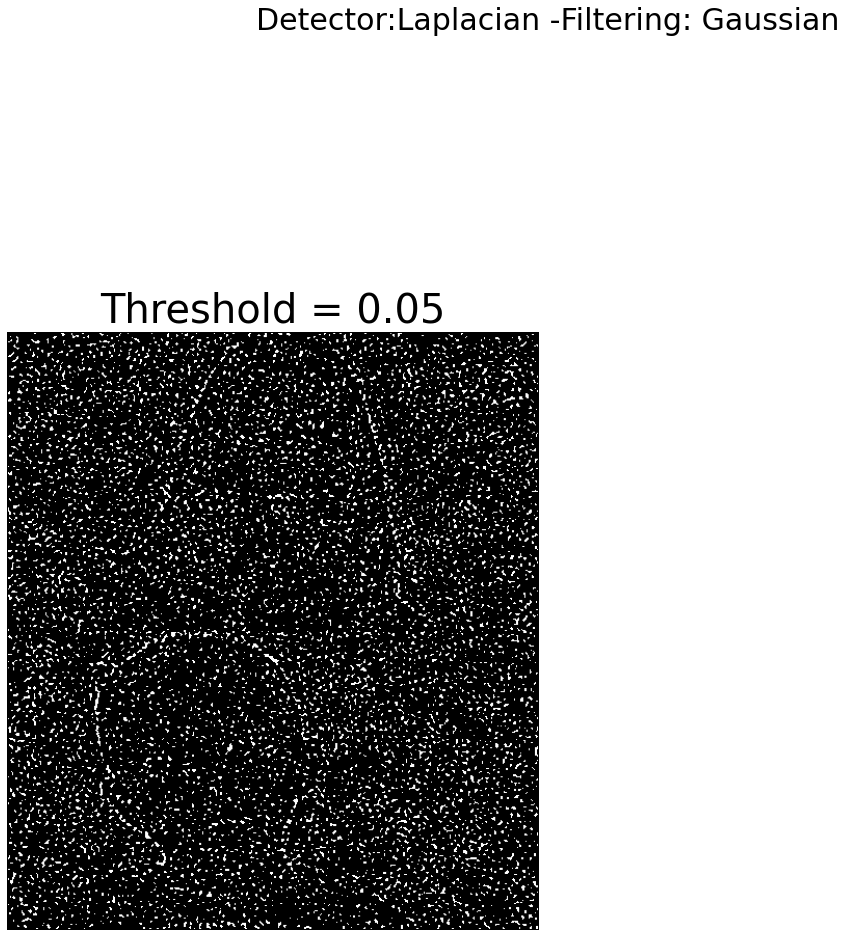

In [19]:
#Καλύτερο αποτέλεσμα με Gaussian  Filtering για sigma = 1.5
filtered=filters.gaussian(sp_noisy, sigma=1.5) 
#plt.imshow(img_log1,cmap = 'gray')

kernels =[laplacian_kernel,laplacian_kernel1]

pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Laplacian -Filtering: Gaussian", size=30)

threshold = 0.05

i=1
# Συνέλιξη με Laplacian και Κανονικοποίηση στο [0,1]
CBlaplacian_filter= np.clip(laplace(filtered), 0, 1)
#Κατωφλιοποίηση (>threshold):
CBlaplacian_filter = CBlaplacian_filter > threshold
pylab.subplot(2,2,i), pylab.imshow(CBlaplacian_filter, cmap='gray'), pylab.axis('off')
pylab.title('Threshold = '+str(threshold), size=40)


pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Γίνεται αντιληπτό ότι στην εικόνα με **Salt and Pepper Noise,** η εξομάλυνση με Gaussian **Filtering** δεν παράγει αξιόλογα αποτελέσματα. Φαίνεται άλλωστε και απο την ανίχνευση.

## 1.2.2 Εξομάλυνση με Mean filter

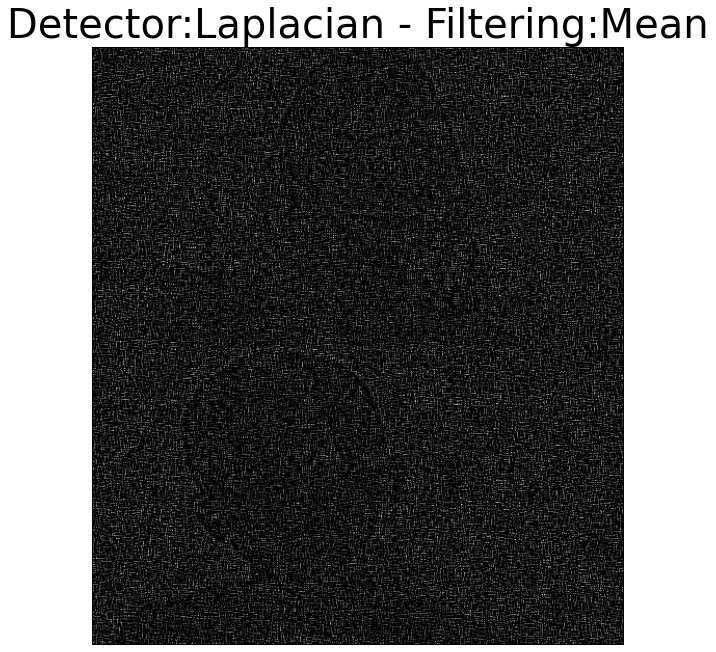

In [20]:
#Καλύτερο αποτέλεσμα με Mean Filtering για kernel (5 x 5 )
filtered=ndi.correlate(sp_noisy,kernel(5))

pylab.figure(figsize=(20,30))

i=1
# Συνέλιξη με Laplacian και Κανονικοποίηση στο [0,1]
CBlaplacian_filter= np.clip(laplace(filtered), 0, 1)
pylab.subplot(2,2,i), pylab.imshow(CBlaplacian_filter, cmap='gray'), pylab.axis('off')
pylab.title("Detector:Laplacian - Filtering:Mean", size=40)


pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Γίνεται αντιληπτό ότι στην εικόνα με **Salt and Pepper Noise,** η εξομάλυνση με Mean **Filtering** δεν παράγει αξιόλογα αποτελέσματα. Φαίνεται άλλωστε και απο την ανίχνευση. Oπότε δεν έχει νόημα να εντοπίσουμε κάποιο κατάλληλο threshold

## 1.2.3 Εξομάλυνση με Median filter

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


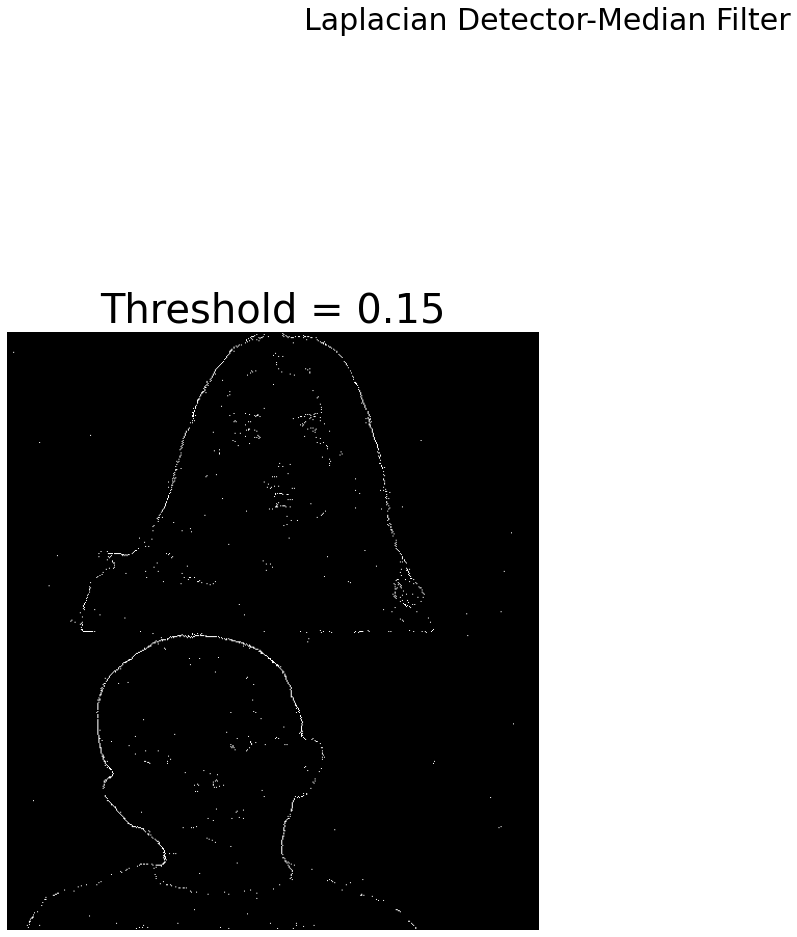

In [21]:
#Καλύτερο αποτέλεσμα με Mean Filtering για radius = 5 
filtered=filters.rank.median(sp_noisy,disk(5))

pylab.figure(figsize=(20,30))
pylab.suptitle("Laplacian Detector-Median Filter", size=30)

threshold = 0.15

i=1
CBlaplacian_filter= np.clip(laplace(filtered), 0, 1)
#Κατωφλιοποίηση (>threshold):
CBlaplacian_filter = CBlaplacian_filter > threshold
pylab.subplot(2,2,i), pylab.imshow(CBlaplacian_filter, cmap='gray'), pylab.axis('off')
pylab.title('Threshold = '+str(threshold), size=40)


pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

**Σημαντική Παρατήρηση**: Παρατηρούμε ότι η καλύτερη εξομάλυνση του **Salt & Pepper** γίνεται με **Median Filtering**.

#2 Canny

# 2.1 Εικόνα με θόρυβο Gaussian 

## 2.1.1 Εξομάλυνση με Gaussian filter

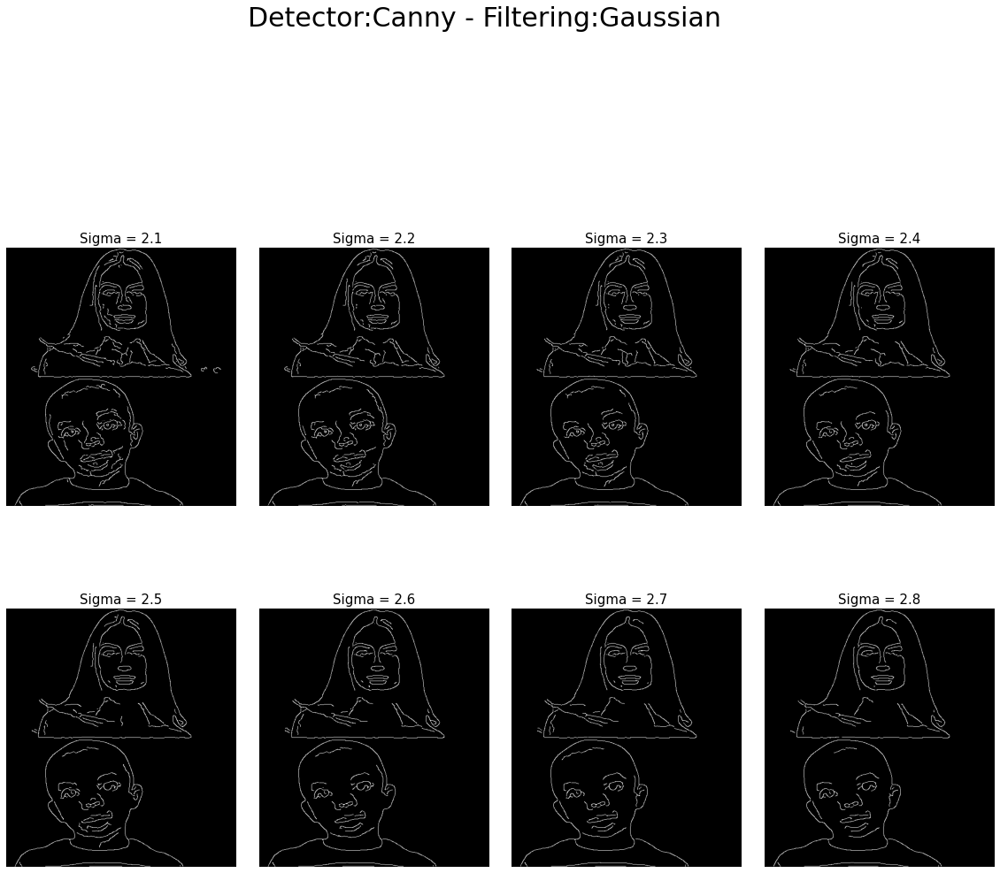

In [22]:
#Ανίχνευση Canny με Gaussian Φίλτρο (Καλύτερο Αποτέλεσμα):

#Aρχική Εικόνα με Gaussian Noise:
img_log1=gaussian_noisy


pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Canny - Filtering:Gaussian", size=30)

#Το καλύτερο αποτέλεσμα ήταν για sigma =2,οπότε θα μελετήσουμε τιμές εκεί γύρω.
#για sigma = [2.1 , 2.2 , (...) ,2.8]
sigma_list = [x*0.1 for x in range(21, 29)]
i=1
for sigma in list(sigma_list):
    img_log= feature.canny(img_log1, sigma)
    if (round(sigma,1) == 2.8):
      Result2 = img_log
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Sigma = '+str(round(sigma,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()




Οπότε κρατάμε τo καλύτερο αποτέέλεσμα ( **για sigma = 2.8** ) και το αποθηκεύουμε σε μια μεταβλητή Result2 για παραγωγή cartoonified

## 2.1.2 Εξομάλυνση με Mean filter


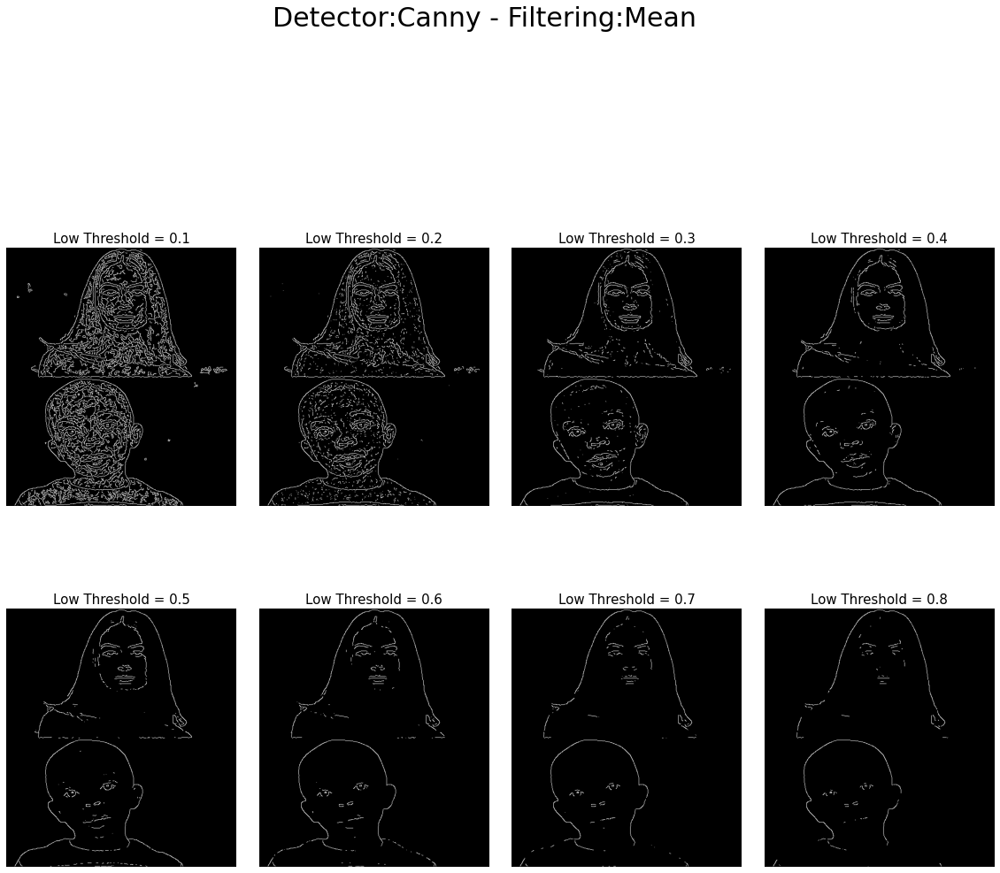

In [23]:
#Ανίχνευση Canny με Mean Φίλτρο (Καλύτερο Αποτέλεσμα):

#Το καλύτερο αποτέλεσμα ήταν για kernel (3 x 3)
img_log1=ndi.correlate(gaussian_noisy,kernel(3))
#plt.imshow(img_log1,cmap='gray')


pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Canny - Filtering:Mean", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1
for threshold in list(threshold_list):
    img_log= feature.canny(img_log1,low_threshold = threshold)
    if (threshold == 0.4):
      Result3 = img_log
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Low Threshold = '+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()


Στο σημείο αυτό, μιας και η παράμετρος **sigma** αφορουσε το φιλτράρισμα **Gaussian** ενώ εμείς θέλουμε να μελετήσουμε το **Mean**, πειραματιστήκαμε με την αλλαγή της παραμέτρου low_threshold στην εξομαλυμένη (*Mean*) εικόνα.

Οπότε αποθηκεύουμε το καλύτερο αποτέλεσμα για **Low Threshold = 0.3**

## 2.1.3 Εξομάλυνση με Median filter

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


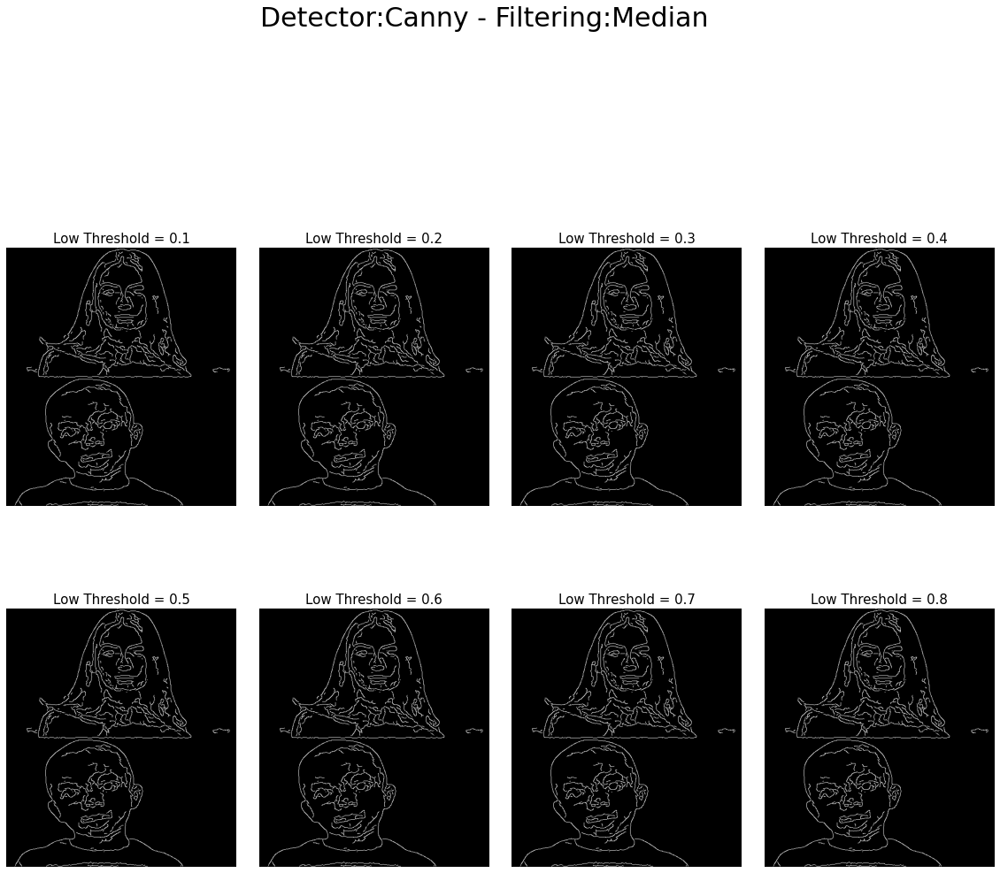

In [24]:
#Ανίχνευση Canny με Median Φίλτρο (Καλύτερο Αποτέλεσμα για r = 4 ):
img_log1=filters.rank.median(gaussian_noisy,disk(4))

pylab.figure(figsize=(20,30))
pylab.suptitle("Detector:Canny - Filtering:Μedian", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1
for threshold in list(threshold_list):
    img_log= feature.canny(img_log1,low_threshold = threshold)
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Low Threshold = '+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()




Παρατηρούμε ότι η μεταβολή στο Threshold δεν επηρεαζει την δυαδική εικόνα ακμών (όπως συνέβαινε στην παραπάνω περίπτωση). Μιας και τα αποτελέσματα μοιάζουν με τα προηγούμενα, δεν κρατάμε κάποιο για κατασκευή Cartoonified Image.



# 2.2 Εικόνα με θόρυβο Salt and Pepper 

## 2.2.1 Εξομάλυνση με Gaussian filter

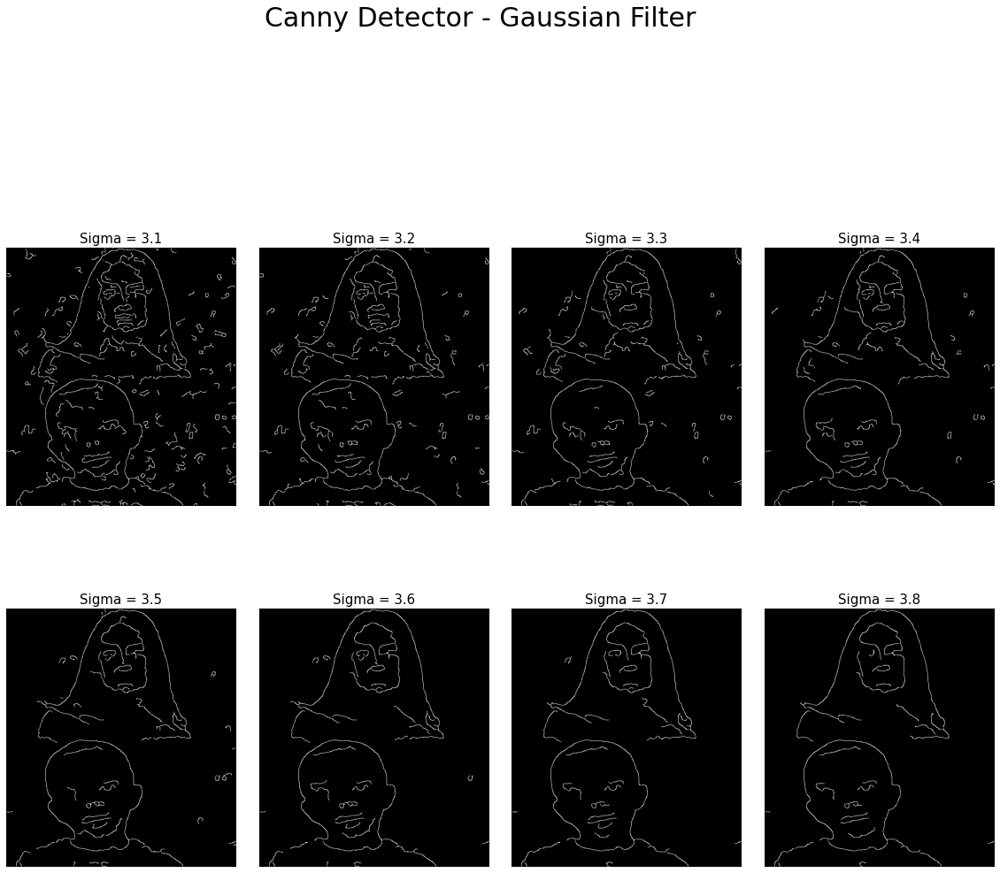

In [25]:
img_log1=sp_noisy

pylab.figure(figsize=(20,30))
pylab.suptitle("Canny Detector - Gaussian Filter ", size=30)

sigma_list = [x*0.1 for x in range(31,39)]
i=1
for sigma in list(sigma_list):
    img_log= feature.canny(img_log1, sigma)
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Sigma = '+str(round(sigma,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

## 2.2.2 Εξομάλυνση με Mean filter

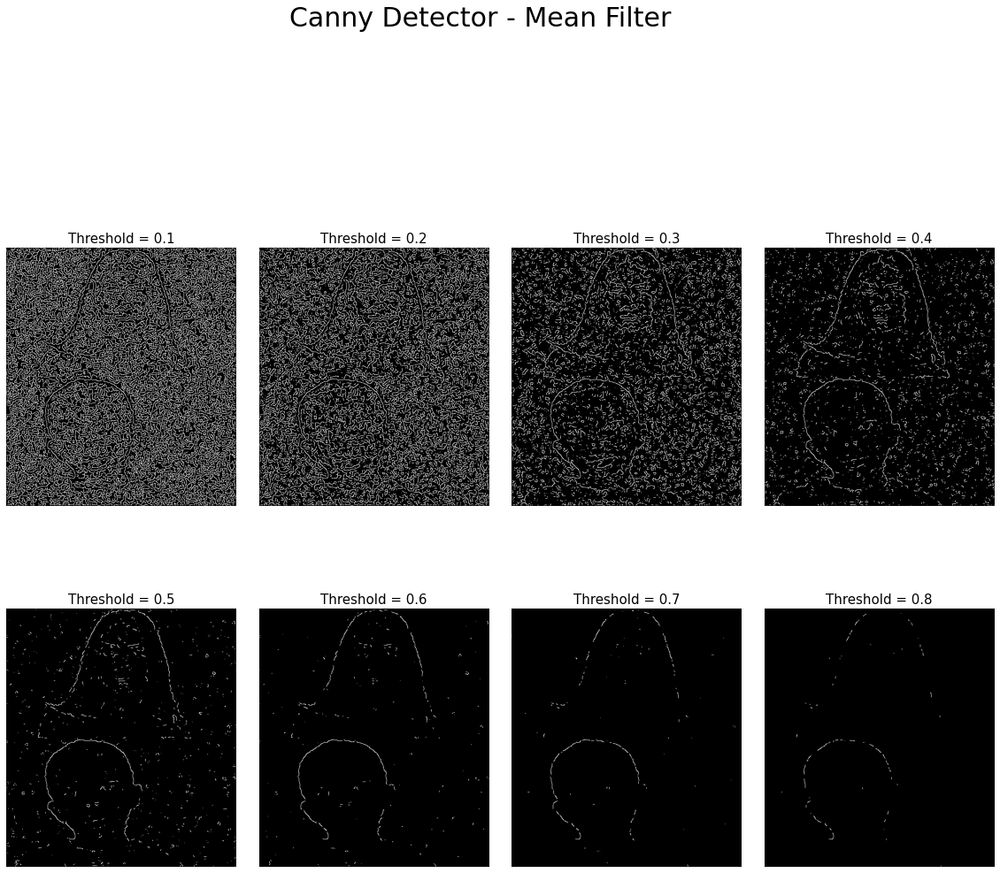

In [26]:
img_log1=ndi.correlate(sp_noisy,kernel(5))
#plt.imshow(img_log1,cmap='gray')


pylab.figure(figsize=(20,30))
pylab.suptitle("Canny Detector - Mean Filter ", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1
for threshold in list(threshold_list):
    img_log= feature.canny(img_log1,low_threshold=threshold)
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Threshold = '+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

Παρατηρούμε ότι ακόμα και με την αλλαγή του Low Threshold, **δεν** γίνεται καλή εξομάλυνση και ο ανιχνευτής **Canny** αδυνατεί να εντοπίσει σωστές ακμές

## 2.2.3 Εξομάλυνση με Median filter

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


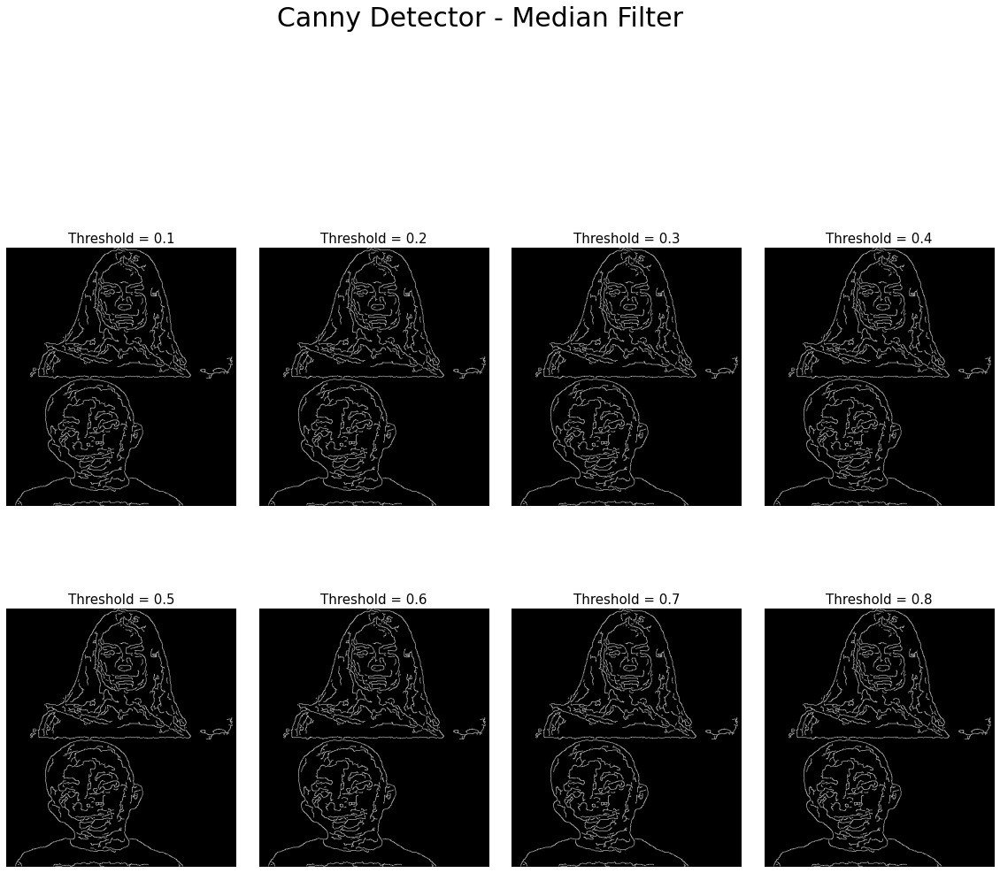

In [27]:
img_log1=filters.rank.median(sp_noisy,disk(5))
#plt.imshow(img_log1,cmap='gray')

pylab.figure(figsize=(20,30))
pylab.suptitle("Canny Detector - Median Filter ", size=30)


threshold_list = [x*0.1 for x in range(1,9)]
i=1
for threshold in list(threshold_list):
    img_log= feature.canny(img_log1,low_threshold=threshold)
    pylab.subplot(4,4,i), pylab.imshow(img_log, cmap='gray'), pylab.axis('off')
    pylab.title('Threshold = '+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

**Σημαντική Παρατήρηση**: Και εδώ φαίνεται άμεαα ότι για **Salt & Pepper** θόρυβο καλό είναι να χρησιμοποιούμε Φιλτράρισμα **Median** 

# 3 Marr-Hildreth

In [28]:
LoG_kernel = [[0,0,1,0,0],[0,1,2,1,0],[1, 2, -16,2,1],[0,1,2,1,0],[0,0,1,0,0]]

# 3.1 Εικόνα με θόρυβο Gaussian

## 3.1.1 Εξομάλυνση με Gaussian filter

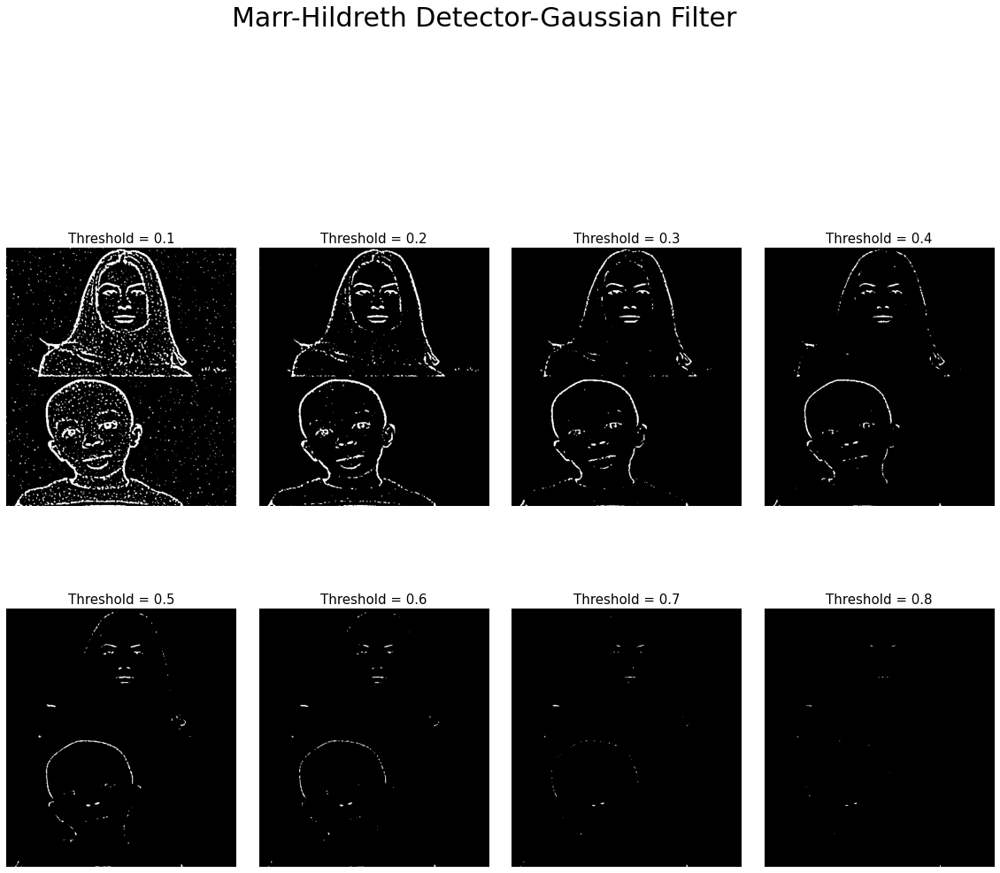

In [29]:
pylab.figure(figsize=(20,30))
pylab.suptitle("Marr-Hildreth Detector-Gaussian Filter", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1
sigma =2
for threshold in list(threshold_list):
    img_log1= ndi.gaussian_laplace(gaussian_noisy, sigma)
    img_log1 = img_log1.astype(np.float)/img_log1.max()
    img_log1 = img_log1 > threshold

    if(threshold == 0.2):
      Result4 = img_log1
    pylab.subplot(4,4,i), pylab.imshow(img_log1, cmap='gray'), pylab.axis('off')
    pylab.title('Threshold = '+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()



Αξιοσημείωτο αποτέλεσμα προκύπτει για Threshold = 0.2 και sigma  = 2

## 3.1.2 Εξομάλυνση με Mean filter

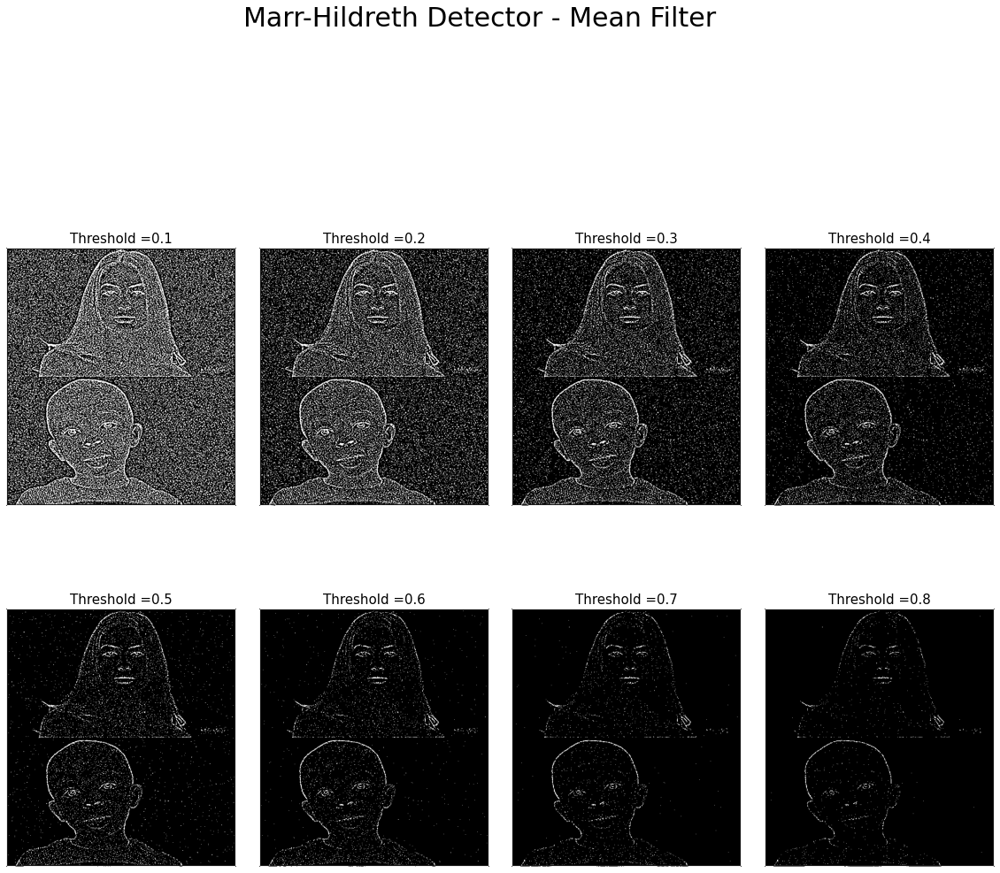

In [30]:
pylab.figure(figsize=(20,30))
pylab.suptitle("Marr-Hildreth Detector - Mean Filter ", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1

k =3
for threshold in list(threshold_list):
    img_log1= ndi.correlate(gaussian_noisy,kernel(k))
    img_log1 = np.clip(signal.convolve2d(img_log1, LoG_kernel),0,1)
    img_log1 = img_log1 > threshold 
    pylab.subplot(4,4,i), pylab.imshow(img_log1, cmap='gray'), pylab.axis('off')
    pylab.title('Threshold ='+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()






## 3.1.3 Εξομάλυνση με Median filter

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


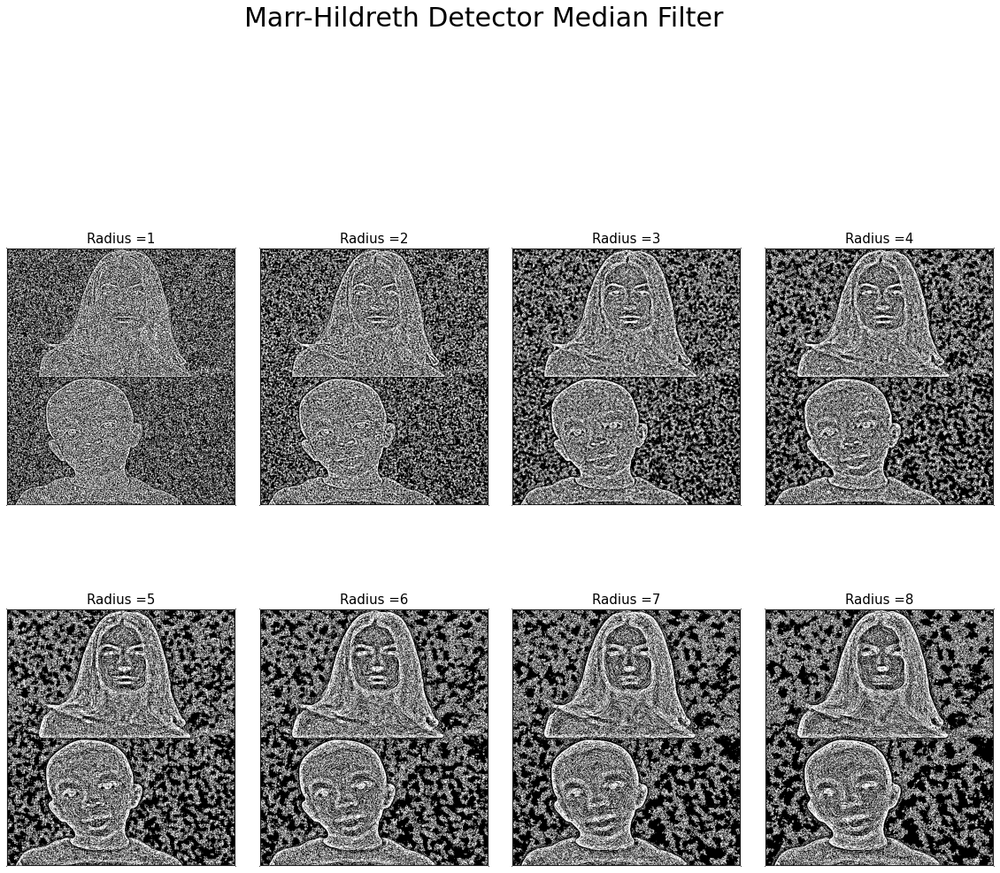

In [31]:
pylab.figure(figsize=(20,30))
pylab.suptitle("Marr-Hildreth Detector Median Filter", size=30)

r_list = [x for x in range(1,9)]
i=1

r = 3 
for r in list(r_list):
    img_log1= filters.rank.median(gaussian_noisy,disk(r))
    img_log1 = np.clip(signal.convolve2d(img_log1, LoG_kernel),0,1)
    img_log1 = img_log1>0.5
    pylab.subplot(4,4,i), pylab.imshow(img_log1, cmap='gray'), pylab.axis('off')
    pylab.title('Radius ='+str(r) , size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

print()

Παρατηρούμε ότι ο ανιχνευτής **Marr-Hildreth** καταφέρνει να εντοπίσει ακμές όταν ο θόρυβος είναι **Salt & Pepper** μόνο όταν επέλθει αποθορυβοποίηση με Gaussian Filtering 

#3.2 Εικόνα με θόρυβο Salt and Pepper

## 3.2.1 Εξομάλυνση με Gaussian filter

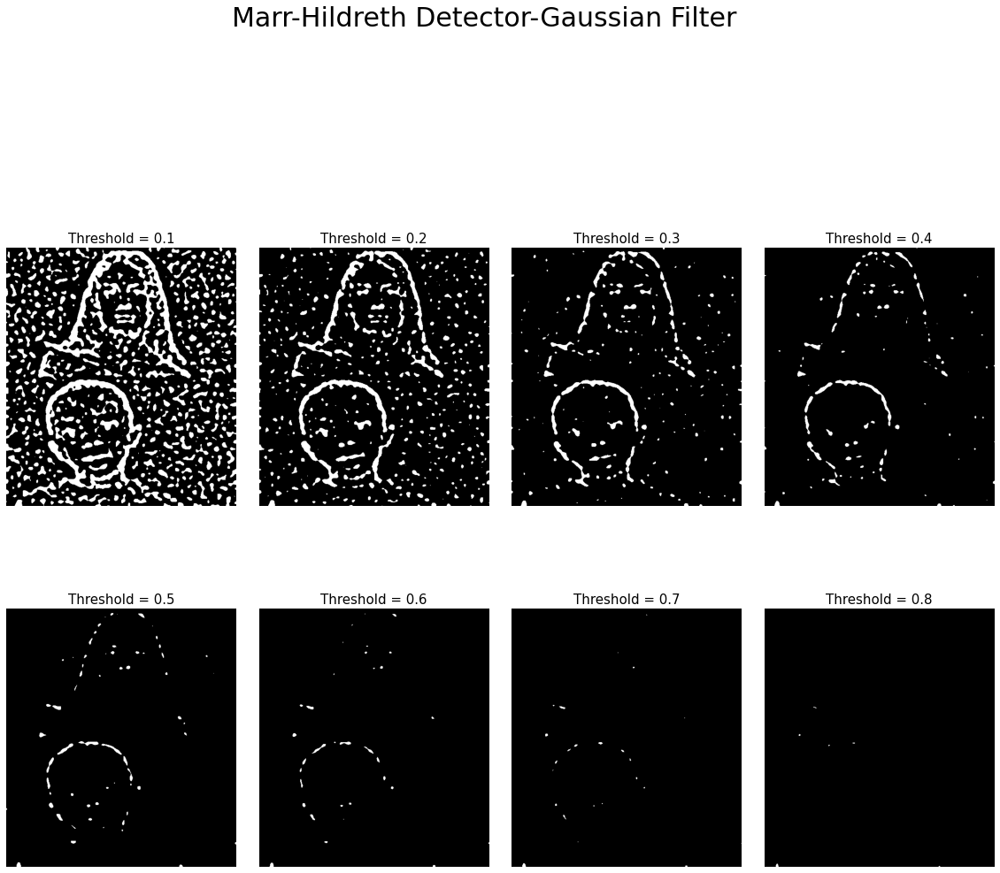

In [32]:
pylab.figure(figsize=(20,30))
pylab.suptitle("Marr-Hildreth Detector-Gaussian Filter", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1
sigma =5
for threshold in list(threshold_list):
    img_log1= ndi.gaussian_laplace(sp_noisy, sigma)
    img_log1 = img_log1.astype(np.float)/img_log1.max()
    img_log1 = img_log1 > threshold
    pylab.subplot(4,4,i), pylab.imshow(img_log1, cmap='gray'), pylab.axis('off')
    pylab.title('Threshold = '+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

## 3.2.2 Εξομάλυνση με Mean filter

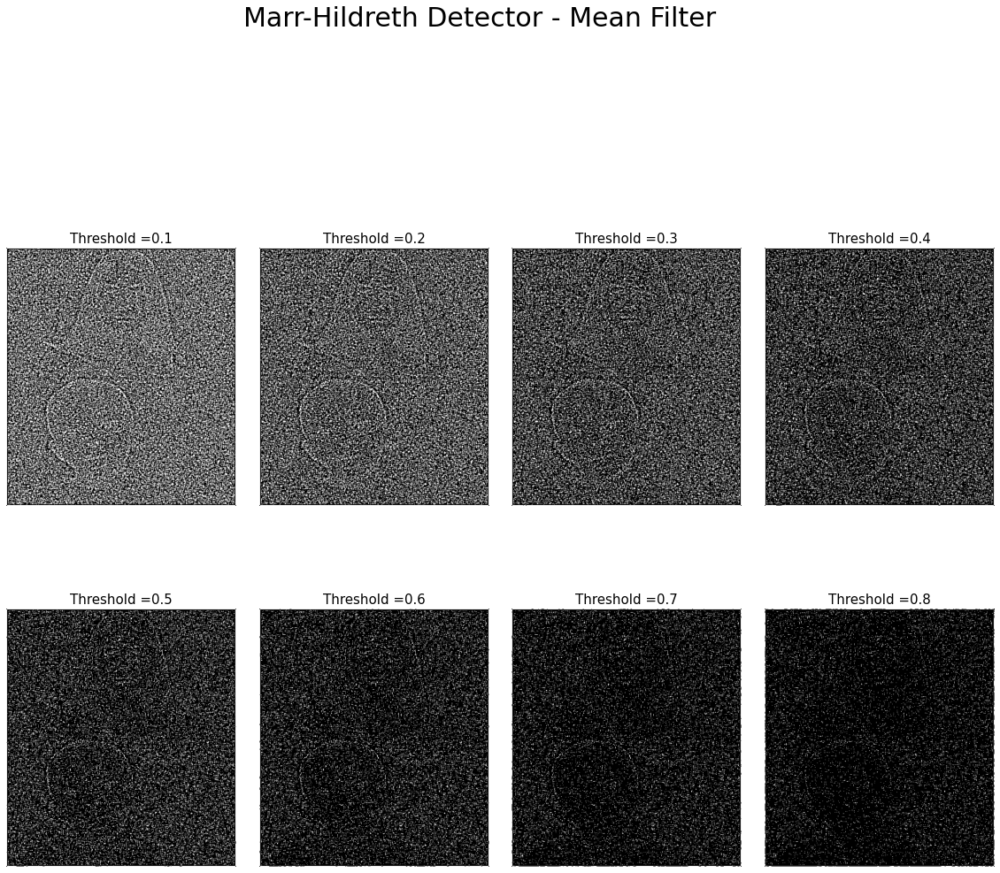

In [33]:
pylab.figure(figsize=(20,30))
pylab.suptitle("Marr-Hildreth Detector - Mean Filter ", size=30)

threshold_list = [x*0.1 for x in range(1,9)]
i=1

k =5
for threshold in list(threshold_list):
    img_log1= ndi.correlate(sp_noisy,kernel(k))
    img_log1 = np.clip(signal.convolve2d(img_log1, LoG_kernel),0,1)
    img_log1 = img_log1 > threshold 
    pylab.subplot(4,4,i), pylab.imshow(img_log1, cmap='gray'), pylab.axis('off')
    pylab.title('Threshold ='+str(round(threshold,1)), size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

## 3.2.3 Εξομάλυνση με Median filter

/usr/local/lib/python3.7/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


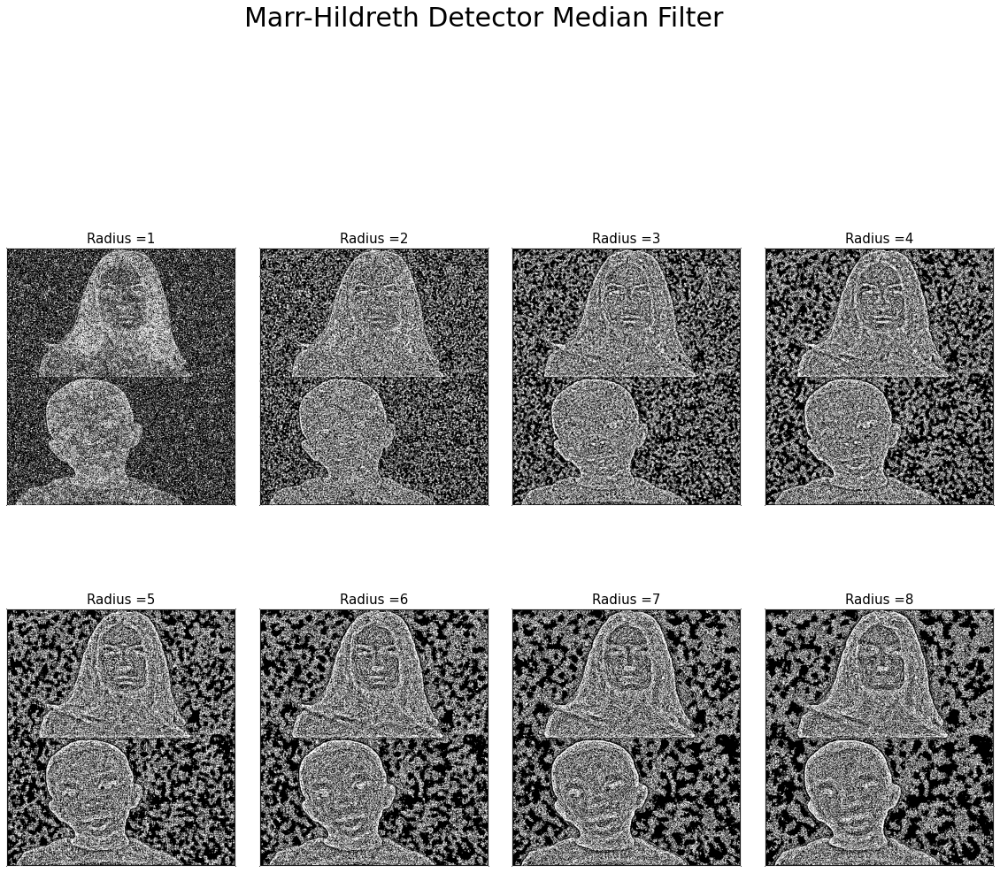

In [34]:
pylab.figure(figsize=(20,30))
pylab.suptitle("Marr-Hildreth Detector Median Filter", size=30)

r_list = [x for x in range(1,9)]
i=1

r = 3 
for r in list(r_list):
    img_log1= filters.rank.median(sp_noisy,disk(r))
    img_log1 = np.clip(signal.convolve2d(img_log1, LoG_kernel),0,1)
    img_log1 = img_log1>0.5
    pylab.subplot(4,4,i), pylab.imshow(img_log1, cmap='gray'), pylab.axis('off')
    pylab.title('Radius ='+str(r) , size=15)
    i=i+1

pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

print()

Παρατηρούμε ότι ο ανιχνευτής **Marr-Hildreth** δεν καταφέρνει να εντοπίσει ακμές όταν ο θόρυβος είναι **Salt & Pepper** όποιος και να ναι ο τύπος αποθορυβοποίησης που κάνουμε(μεταξύ βέβαια των τριών ειδών Filtering που δοκιμάσαμε). 

6.   Να αναπτύξετε **μέθοδο** που θα δέχεται σαν είσοδο την **αρχική εικόνα** και μια **εικόνα ακμών** και θα επιστρέφει μια εικόνα, στην οποία τα pixels της αρχικής εικόνας, που αντιστοιχούν στα pixels ακμών της εικόνας ακμών, θα έχουν αντικατασταθεί από χρώμα της επιλογής σας (κατά προτίμηση, μαύρο). Να χρησιμοποιήσετε τη μέθοδο αυτή για να παράξετε το cartoonified αποτέλεσμα, χρησιμοποιώντας ως εικόνες ακμών τα αποτελέσματα του βήματος 5. Συγκρίνετε την απόδοση των διαφορετικών αλγορίθμων και πειραματισμών και εξηγήστε με ποιον τρόπο πήρατε το πιο καθαρό και αισθητικά καλύτερο αποτέλεσμα.

# **ΕΡΩΤΗΣΗ 6: CARTOONIFIED RESULT** 

In [35]:
def cartoonify(source_img, edge_img):
  x,y = np.where(edge_img == True)
  source_img[x,y,:] = 0 
  return source_img

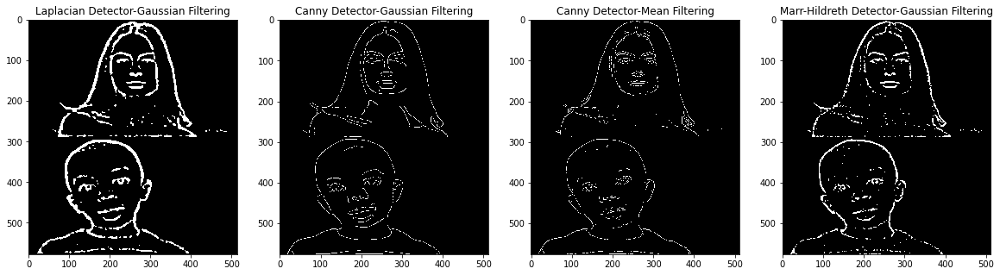

In [36]:
#Δυαδικές Εικόνες Ακμών (Μια Επιλογή των καλύτερων Ανιχνεύσεων)
imshow_all(Result1,Result2,Result3,Result4,titles = ['Laplacian Detector-Gaussian Filtering','Canny Detector-Gaussian Filtering','Canny Detector-Mean Filtering','Marr-Hildreth Detector-Gaussian Filtering'])

In [37]:
######Εμφάνιση Τελικών Φωτογραφιών :

# # # #    Laplacian Detector-Gaussian Filtering   # # # #

combined_image = np.concatenate((img1, img2), axis=0)

#### Επειδή για το Result1 πραγματοποιήθηκε κάποιο zero padding
#### Αποκτουμε μια λωρίδα- περιτύλιγμα πάχουν 1 pixel
#print(Result1.shape)
#### Αρχικά Result1.shape = (578,514) 

Result1 = Result1[1:577,1:513]
#print(Result1.shape)
#### Τελικα Result1.shape = (576,512) 
car1 = cartoonify(combined_image,Result1)


#### Οι υπόλοιπες δυαδικές Εικόνες,
#### δε χρειάζονται αναδιαμόρφωση του shape 



# # # #         Canny Detector-Gaussian Filtering      # # # #

combined_image = np.concatenate((img1, img2), axis=0)
car2 = cartoonify(combined_image,Result2)

# # # #         Canny Detector-Mean Filtering          # # # #

combined_image = np.concatenate((img1, img2), axis=0)
car3 = cartoonify(combined_image,Result3)

# # # #    Marr-Hildreth Detector-Gaussian Filtering   # # # #

combined_image = np.concatenate((img1, img2), axis=0)
car4 = cartoonify(combined_image,Result4)




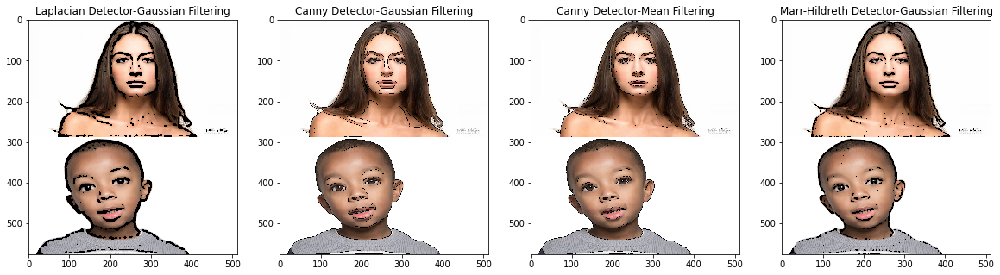

In [38]:
#Cartoonified Images για τις παραπάνω Δυαδικές Εικόνες
imshow_all(car1,car2,car3,car4,titles = ['Laplacian Detector-Gaussian Filtering','Canny Detector-Gaussian Filtering','Canny Detector-Mean Filtering','Marr-Hildreth Detector-Gaussian Filtering'])

Text(0.5, 1.0, 'Καλύτερο Cartoonified Αποτέλεσμα (for Instagram Story)')

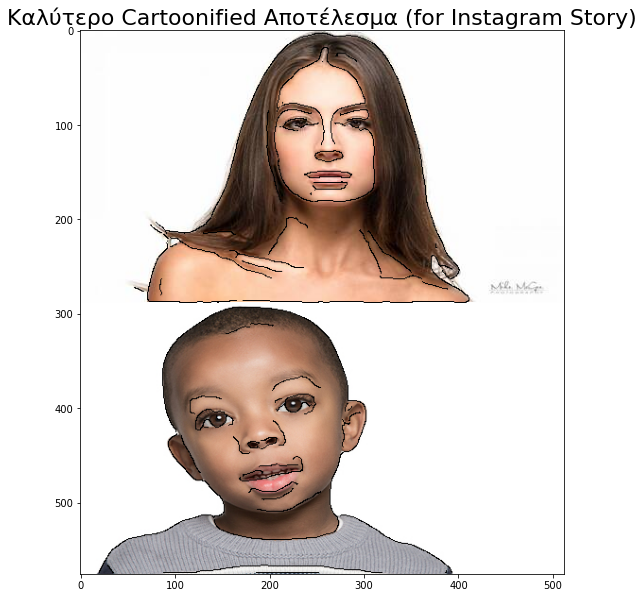

In [39]:
# Επιλογή καλύτερου Αποτελέσματος 
combined_image = np.concatenate((img1, img2), axis=0)
car2 = cartoonify(combined_image,Result2)


plt.figure(figsize=(20,10))
plt.imshow(car2)
plt.title("Καλύτερο Cartoonified Αποτέλεσμα (for Instagram Story)",size=22)

**Γενικά Σχόλια :** Να σημειωθεί ότι το καλύτερο αποτέλεσμα επιτεύχθη με τον ανιχνευτή **Canny και Gaussian Filtering**. Βέβαια όπως φαίνεται και απο τους πειραματισμούς μας και οι άλλες μέθοδοι εντόπισαν ικανοποιητικά τις ακμές. Σε καμια περίπτωση βέβαια δεν εντοπίστηκε το σύνολο των ακμών. Ανάμενόμενο, αν λάβει κανείς υπόψιν


1.   **Παρουσία Σκιάς**: (Κάτω απο τα μάτια στην εικόνα "george)
2.   **Συνθήκες Φωτισμού**: Το σαγόνι αλλά και τα χείλη στην εικόνα "mary" έχουν τον ίδιο χρώμα με τη γειτονική τους περιοχή, οπότε για αυτό δεν εντοπίστηκαν.
3.   Η δυαδική εικόνα ακμών προέκυψε απο **προσθήκη θορύβου** και στην συνέχεια εξομάλυνση η οποία όμως δεν εξάλειψε το 100% του θορύβου.




